# Importing essential libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
import pickle
from sklearn.cluster import KMeans

# Mounting drive for storing and accessing data

In [ ]:
from google.colab import drive

drive.mount('/content/gdrive')
ROOT_PATH = 'gdrive/My Drive/tede_data2/'

Mounted at /content/gdrive


# Utility Functions

In [ ]:
def load_data(*paths, function):
    assert(paths)
    to_return = [function(path) for path in paths]
    return to_return if len(to_return) != 1 else to_return[0]

def write_pkl(path, obj):
    with open(path, 'wb') as file:
        pickle.dump(obj, file)

# Functions for data plotting

In [ ]:
def ver_bar_plot(height, bars, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds', style='seaborn', dim=None):
    mpl.style.use(style)
    plt.figure(figsize=dim if dim else plt.rcParams["figure.figsize"]) 

    x_pos = [pos * width_offset for pos in np.arange(len(height))]

    my_cmap = plt.get_cmap(cmap)
    rand = np.random.uniform(low=low, high=high, size=len(height))
    plt.bar(x_pos, height, color=my_cmap(rand))

    plt.xlabel(xname)
    plt.ylabel(yname)

    plt.xticks(x_pos, bars)
    plt.title(title)
    plt.show()

# Data analysis

In [ ]:
def outliers(df, column, geq, leq):
    return df[(df[column] >= geq) & (df[column] <= leq)]

In [ ]:
df = load_data(ROOT_PATH + 'data/train.csv', function=pd.read_csv)

## Question 1

In [ ]:
stats = df.describe()

mean = stats['trip_duration']['mean']
std = stats['trip_duration']['std']

size = len(df)
df = outliers(df, 'trip_duration', mean - 2 * std, mean + 2 * std)

print('Outliers removed: %d\n' % (size - len(df)))

Outliers removed: 1665



## Question 2

In [ ]:
city_long_border = (-74.03, -73.75)
city_lat_border = (40.63, 40.85)

size = len(df)
df = outliers(df, 'pickup_longitude', city_long_border[0], city_long_border[1])
df = outliers(df, 'dropoff_longitude', city_long_border[0], city_long_border[1])
df = outliers(df, 'pickup_latitude', city_lat_border[0], city_lat_border[1])
df = outliers(df, 'dropoff_latitude', city_lat_border[0], city_lat_border[1])

print('Outliers removed: %d\n' % (size - len(df)))

Outliers removed: 15516



### Question 3

### Modification of datasets

In [ ]:
def modify_datetime_columns(df, has_dropoff=True):
    pickup_dates = pd.to_datetime(df['pickup_datetime'].values)
    df['pickup_datetime'] = pickup_dates

    if not has_dropoff:
        return df, pickup_dates

    dropoff_dates = pd.to_datetime(df['dropoff_datetime'].values)
    df['dropoff_datetime'] = dropoff_dates
    return df, pickup_dates, dropoff_dates

def add_datetime_columns(df, dates, prefix):
    seasons = { 12: 'Winter', 1: 'Winter', 2: 'Winter',
                3: 'Spring', 4: 'Spring', 5: 'Spring',
                6: 'Summer', 7: 'Summer', 8: 'Summer',
                9: 'Autumn', 10: 'Autumn',11: 'Autumn'}

    def get_day_period(time):
        if time.hour < 6:
            return 'Late Night'

        if time.hour < 12:
            return 'Morning'
        
        if time.hour < 16:
            return 'Afternoon'
        
        if time.hour < 22:
            return 'Evening'

        return 'Late Night'


    df[prefix + '_day_period'] = [get_day_period(time) for time in dates.time]
    df[prefix + '_day_name'] = [day.strftime("%A") for day in dates]
    df[prefix + '_month'] = dates.month
    df[prefix + '_hour'] = dates.hour
    df[prefix + '_year'] = dates.year
    df[prefix + '_season'] = [seasons[month] for month in dates.month]

    return df

#### Train set
Modifying the existing columns `pickup_datetime` and `dropoff_datetime` to have `datetime64` type values instead of strings, then adding the new columns for both pickup and dropoff dates.

Finally saving the new dataset for future use.

In [ ]:
df, pickup_dates, dropoff_dates = modify_datetime_columns(df)
df = add_datetime_columns(df, pickup_dates, 'pickup')
df = add_datetime_columns(df, dropoff_dates, 'dropoff')

In [ ]:
write_pkl(ROOT_PATH + 'data/train_new.pkl', df)

#### Test set
We don't remove any outliers, so we only have to read the test set, modify, add the columns and finally store it for future use, as we did on the train set.

In [ ]:
df_test = load_data(ROOT_PATH + 'data/test.csv', function=pd.read_csv)
df_test, pickup_dates = modify_datetime_columns(df_test, has_dropoff=False)
df_test = add_datetime_columns(df_test, pickup_dates, 'pickup')

In [ ]:
write_pkl(ROOT_PATH + 'data/test_new.pkl', df_test)

### Trips x Day

In [ ]:
def plot_days(occur, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds'):
    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
    ver_bar_plot([(occur[day] if day in occur else 0) for day in days], days, xname=xname, yname=yname,
                title=title, width_offset=width_offset, low=low, high=high, cmap=cmap)

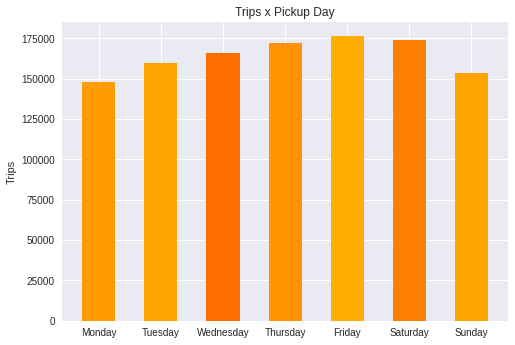

In [ ]:
occur = pd.Series(df['pickup_day_name'].values).value_counts()
plot_days(occur, title='Trips x Pickup Day', yname='Trips', cmap='autumn', low=.3, high=.7)

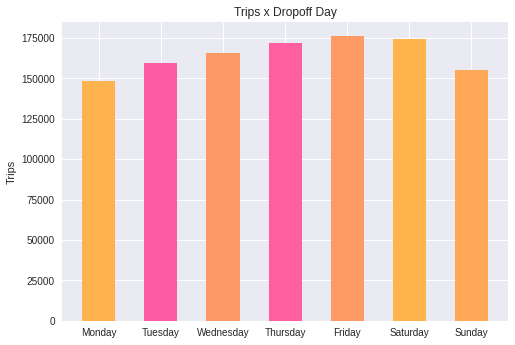

In [ ]:
occur = pd.Series(df['dropoff_day_name'].values).value_counts()
plot_days(occur, title='Trips x Dropoff Day', yname='Trips', cmap='spring', low=.3, high=.7)

We observe that more trips are made during Friday and Saturday (end of the working days).  <br>
A possible reason for this, is that more people are willing to spend on taxi fares when going out for fun, than going for work.

### Trips x Day Period

In [ ]:
def plot_day_periods(occur, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds'):
    periods = ['Morning', 'Afternoon', 'Evening', 'Late Night']
    ver_bar_plot([(occur[period] if period in occur else 0) for period in periods], periods, xname=xname, yname=yname,
                title=title, width_offset=width_offset, low=low, high=high, cmap=cmap)

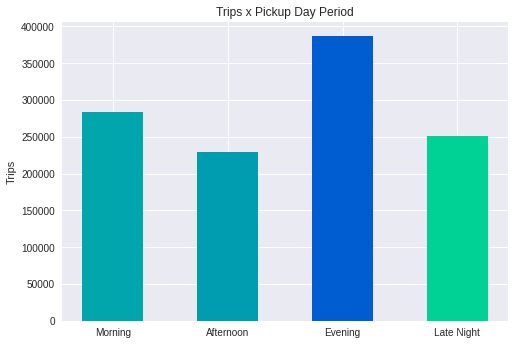

In [ ]:
occur = pd.Series(df['pickup_day_period'].values).value_counts()
plot_day_periods(occur, title='Trips x Pickup Day Period', yname='Trips', cmap='winter', low=.3, high=1.)

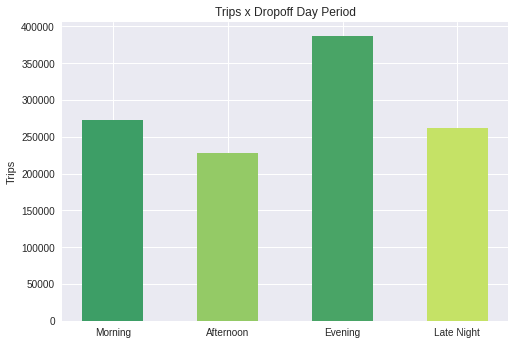

In [ ]:
occur = pd.Series(df['dropoff_day_period'].values).value_counts()
plot_day_periods(occur, title='Trips x Dropoff Day Period', yname='Trips', cmap='summer', low=.2, high=.9)

We notice that most trips happen on the evening hours (4pm to 10pm)

A possible explaination for this could be that these are the times in which people return from home and go out for the evening all around town.

### Trips x Month

For pickup months, there are no samples with a value greater than 6 (ie June through December).

For dropoff months, there are no samples with a value greater than 7 (ie July through December) and there are only 94 for the month of June, hence it will not be visible on the bar plot since it is tiny in comparison to the other months.

In [ ]:
def plot_months(occur, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds'):
    months = ['Dec', 'Jan', 'Feb', 
              'Mar', 'Apr', 'May', 
              'Jun', 'Jul', 'Aug', 
              'Sep', 'Oct', 'Nov']
              
    ver_bar_plot([(occur[m] if m in occur else 0) for m in range(1,13)], months,  xname=xname, yname=yname,
                 title=title, width_offset=width_offset, low=low, high=high, cmap=cmap)

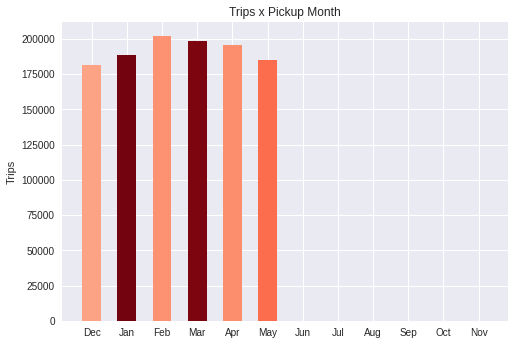

In [ ]:
occur = pd.Series(df['pickup_month'].values).value_counts().sort_index()
plot_months(occur, title='Trips x Pickup Month', yname='Trips', cmap='Reds', low=.3, high=1.)

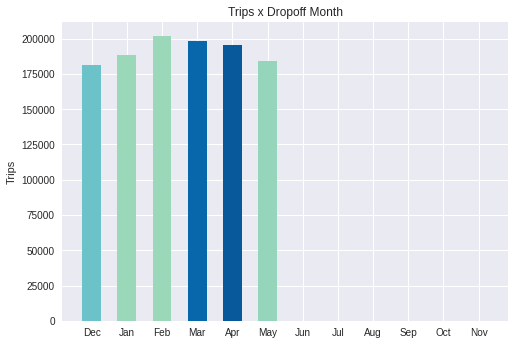

In [ ]:
occur = pd.Series(df['dropoff_month'].values).value_counts().sort_index()
plot_months(occur, title='Trips x Dropoff Month', yname='Trips', cmap='GnBu', low=.3, high=1.)

We notice a 10% difference on the number of trips from the lowest month to the highest which isn't significant. Maybe if we had data after May, we could have made an inference.

### Mean trip duration per pickup hour

In [ ]:
def plot_pickup_hours(occur, title='', xname='', yname='', width_offset=5.1, low=.3, high=1., cmap='Reds', style='seaborn'):
    ver_bar_plot([occur[i] for i in range(24)], 
                [i for i in range(24)],  xname=xname, yname=yname,
                title=title, width_offset=width_offset, low=low, high=high, cmap=cmap, style=style)

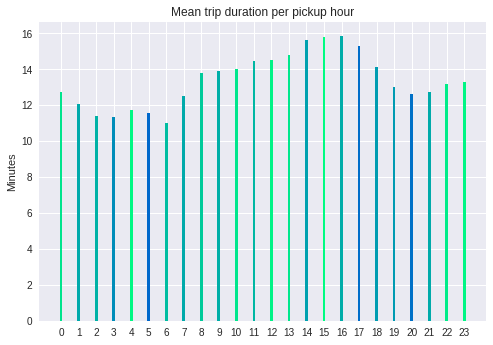

In [ ]:
occur = pd.Series(df.groupby('pickup_hour')['trip_duration'].mean() / 60)
plot_pickup_hours(occur, title='Mean trip duration per pickup hour', yname='Minutes', cmap='winter', low=.3, high=1.)

We see that in contrast to the number of trips per period, the mean trip duration is actually higher between 9am and 4pm and not the morning/evening, because New York's traffic is not only depended on taxi rides, but on the individual vehicles and public transportation as well.

These hours are the so called rush hours and they are expected to have the most traffic as people go to and return from work during this time interval. 

### Mean trip duration per day period

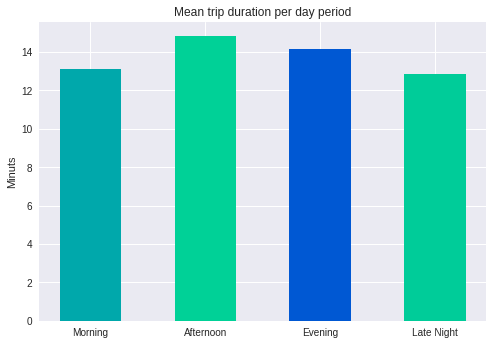

In [ ]:
occur = pd.Series(df.groupby('dropoff_day_period')['trip_duration'].mean()  / 60)
plot_day_periods(occur, title='Mean trip duration per day period', yname='Minuts', cmap='winter', low=.3, high=1.)

Just a more condenced version of the previous graph.

### Mean trip duration per day

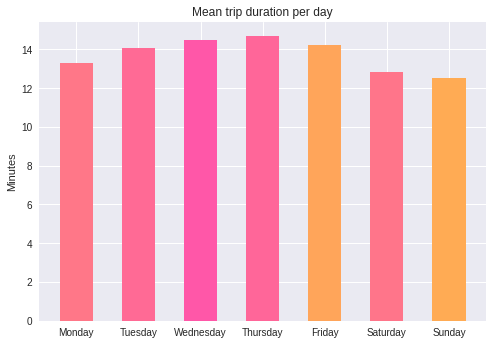

In [ ]:
occur = pd.Series(df.groupby('dropoff_day_name')['trip_duration'].mean()  / 60)
plot_days(occur, title='Mean trip duration per day', yname='Minutes', cmap='spring', low=.3, high=.7)

One can see that in the weekend, we see a reduction in the trip duration. <br>
A possible reason for this, is that some people leave from NY at weekends, in order to go in the countryside, thus reducing the city traffic. <br>
Another reason could be that many people don't work on the weekends, hence there are less traffic on those days.



## Question 4

In [ ]:
def bins_bar_plot(values, bins_number=100, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds', style='seaborn', dim=None):
    values.sort()
    interval = (values[-1] + 1) / bins_number
    bins = np.histogram(values, bins=[i * interval for i in range(bins_number + 1)]) 
    
    mpl.style.use(style)
    plt.figure(figsize=dim if dim else plt.rcParams["figure.figsize"]) 

    x_pos = [pos * width_offset for pos in np.arange(len(bins[0]))]

    my_cmap = plt.get_cmap(cmap)
    rand = np.random.uniform(low=low, high=high, size=len(bins[0]))
    plt.bar(x_pos, bins[0], color=my_cmap(rand))
    

    x_pos = [pos * width_offset for pos in np.arange(len(bins[1]))]
    plt.xticks(x_pos[::10], [int(i) for i in bins[1][::10]])

    plt.xlabel(xname)
    plt.ylabel(yname)
    plt.title(title)
    plt.show()

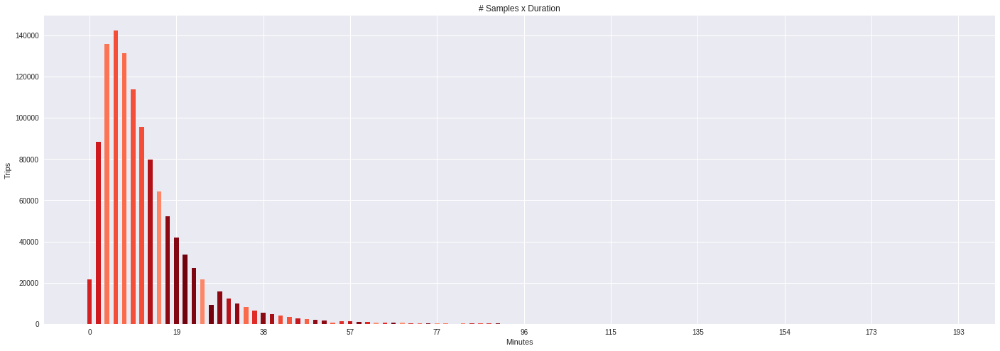

In [ ]:
bins_bar_plot([i // 60 for i in df['trip_duration'].values], title='# Samples x Duration', xname='Minutes', yname='Trips', dim=(24,8))

We notice that although there are trips with duration as high as $\approx 190$ minutes, the counts of trips that last more than $\approx 77$ minutes aren't visible on the plot 

The overwhelming majority of the trips last between $0$ and $20$ minutes, which for a city the size of New York and its traffic is reasonable.

In [ ]:
df['log_trip_duration'] = [np.log(i) for i in df['trip_duration'].values]

In [ ]:
write_pkl(ROOT_PATH + 'data/train_new.pkl', df)

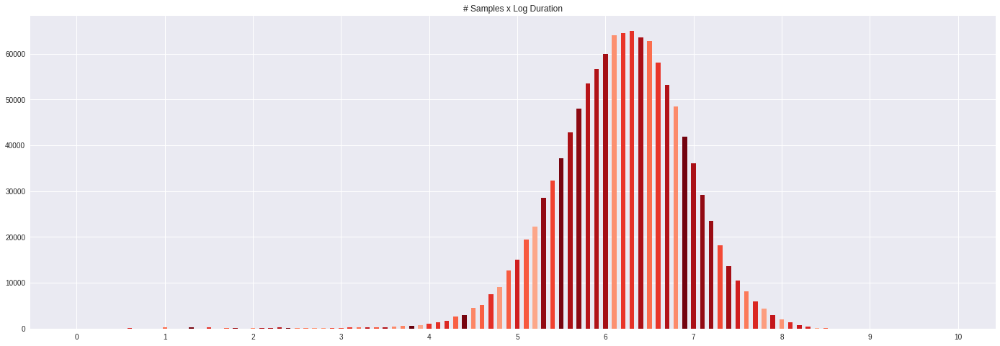

In [ ]:
bins_bar_plot(list(df['log_trip_duration'].values), title='# Samples x Log Duration', dim=(24,8))

##Question 5

In [ ]:
def plot_vendors(occur, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds'):
    vendors = [1, 2]
    ver_bar_plot([(occur[m] if m in occur else 0) for m in vendors], vendors, xname=xname, yname=yname,
                 title=title, width_offset=width_offset, low=low, high=high, cmap=cmap)

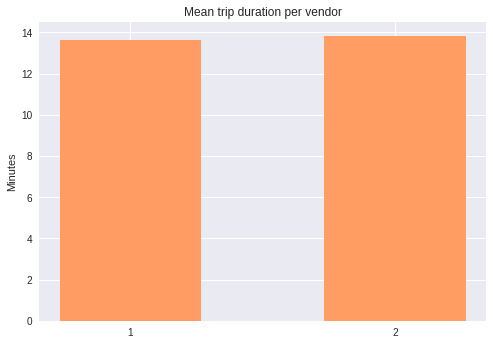

In [ ]:
occur = pd.Series(df.groupby('vendor_id')['trip_duration'].mean() / 60)
plot_vendors(occur, title='Mean trip duration per vendor', yname='Minutes', cmap='spring', low=.3, high=.7)

Practically, the vendor does not affect at all the trip duration.

##Question 6

Passenger count and mean trip duration 

In [ ]:
def plot_passengers(occur, title='', xname='', yname='', width_offset=1.5, low=.3, high=1., cmap='Reds'):
    passenger_count = [i for i in range (7)]

    ver_bar_plot([(occur[m] if m in occur else 0) for m in passenger_count], passenger_count, xname=xname, yname=yname,
                 title=title, width_offset=width_offset, low=low, high=high, cmap=cmap)

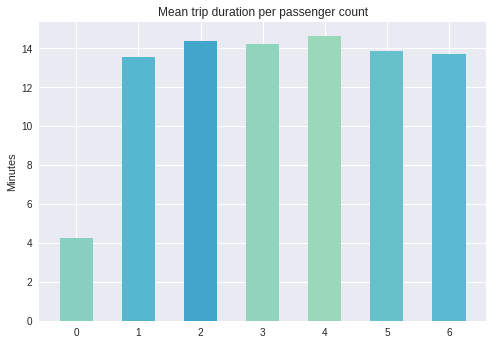

In [ ]:
occur = pd.Series(df.groupby('passenger_count')['trip_duration'].mean() / 60)
plot_passengers(occur, title='Mean trip duration per passenger count', yname='Minutes', cmap='GnBu', low=.3, high=.7)

We see that the passsenger count does not have a significant impact on the trip duration. <br>
The only inference that we can make, is that when having 0 passengers (thus making a delivery or possibly going to pickup a client), the trip duration is much faster. This may be based on the fact that some deliveries are not being made during rush hours.

## Question 7

In [ ]:
def man_dist(x1, y1, x2, y2):
    return abs(x1 - x2) + abs(y1 - y2)

In [ ]:
df['distance'] = [man_dist(x1, y1, x2, y2) for x1, y1, x2, y2 in zip(df['pickup_longitude'].values, 
                                                                     df['pickup_latitude'].values, 
                                                                     df['dropoff_longitude'].values, 
                                                                     df['dropoff_latitude'].values)]

df_test['distance'] = [man_dist(x1, y1, x2, y2) for x1, y1, x2, y2 in zip(df_test['pickup_longitude'].values, 
                                                                          df_test['pickup_latitude'].values, 
                                                                          df_test['dropoff_longitude'].values, 
                                                                          df_test['dropoff_latitude'].values)]

In [ ]:
write_pkl(ROOT_PATH + 'data/train_new.pkl', df)
write_pkl(ROOT_PATH + 'data/test_new.pkl', df_test)    

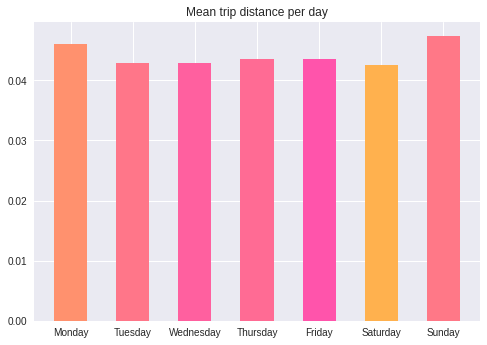

In [ ]:
occur = pd.Series(df.groupby('dropoff_day_name')['distance'].mean())
plot_days(occur, title='Mean trip distance per day', cmap='spring', low=.3, high=.7)

In [ ]:
def plot_points(x, y, xname='', yname='', title='', cmap='Reds', style='seaborn', dim=None, s=10, alpha=1.):
    mpl.style.use(style)
    plt.figure(figsize=dim if dim else plt.rcParams["figure.figsize"]) 

    plt.scatter(x, y, c=x / max(x) + y / max(y), cmap=cmap, s=s, alpha=alpha)
    plt.title(title) 
    
    plt.xlabel(xname)
    plt.ylabel(yname)

    plt.show()

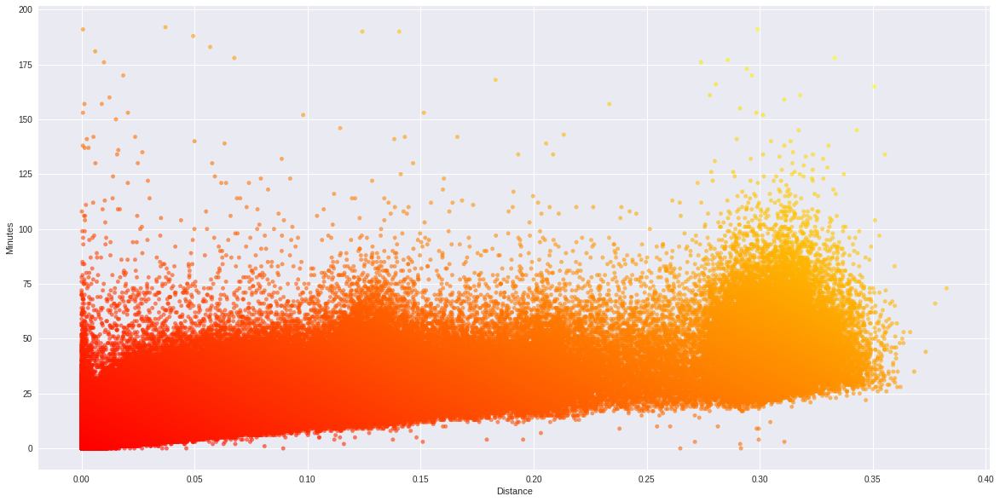

In [ ]:
x = df['distance'].values
y = [i // 60 for i in df['trip_duration'].values]

plot_points(x, y, xname='Distance', yname='Minutes', cmap='autumn', dim=(20,10), s=20, alpha=0.6)

We see that there seems to be a big correlation between distance and trip duration.

## Question 8
We add an extra column in our dataframe, expressing the average speed.

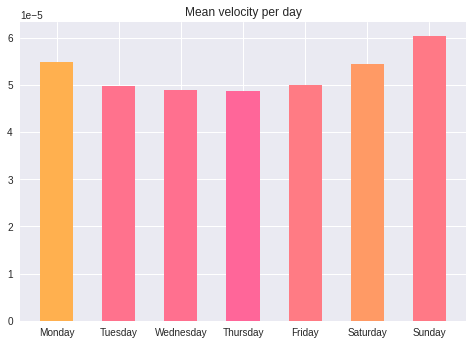

In [ ]:
df['velocity'] = [dist / time  for dist, time in zip(df['distance'].values, df['trip_duration'].values)]

occur = pd.Series(df.groupby('dropoff_day_name')['velocity'].mean())
plot_days(occur, title='Mean velocity per day', cmap='spring', low=.3, high=.7)

We see that during work days, the average velocity is quite small.

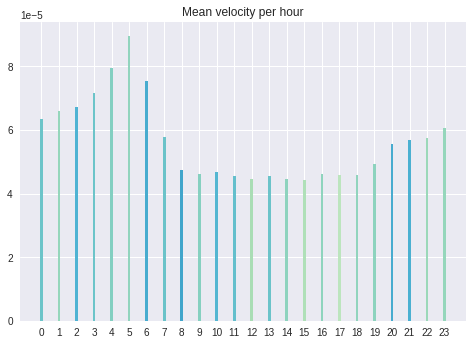

In [ ]:
occur = pd.Series(df.groupby('pickup_hour')['velocity'].mean())
plot_pickup_hours(occur, title='Mean velocity per hour', cmap='GnBu', low=.3, high=.7)

We see that during rush hours, the average velocity is quite small, as expected. <br>Max velocity is seen at 5AM where streets are pretty empty, as opposed to later in the morning.

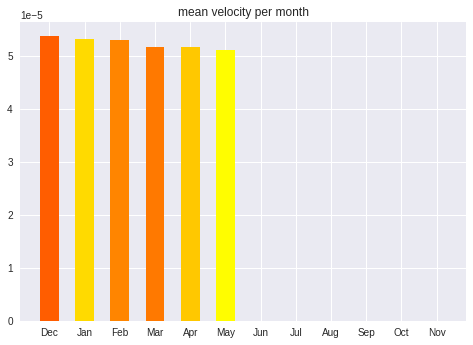

In [ ]:
occur = pd.Series(df.groupby('pickup_month')['velocity'].mean())
plot_months(occur, title='mean velocity per month',  cmap='autumn', low=.3, high=1.)

We see that the month doesn't affect a lot the average velocity. Maybe if we had data after May, we could have made an inference.

## Question 9

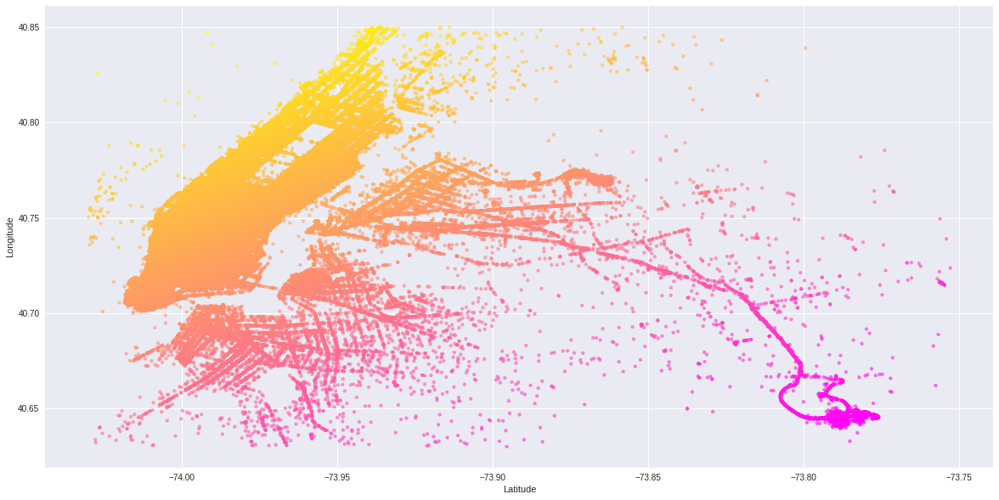

In [ ]:
x = df['pickup_longitude'].values
y = df['pickup_latitude'].values

plot_points(x, y, xname='Latitude', yname='Longitude', cmap='spring', dim=(20,10), s=15, alpha=0.6)

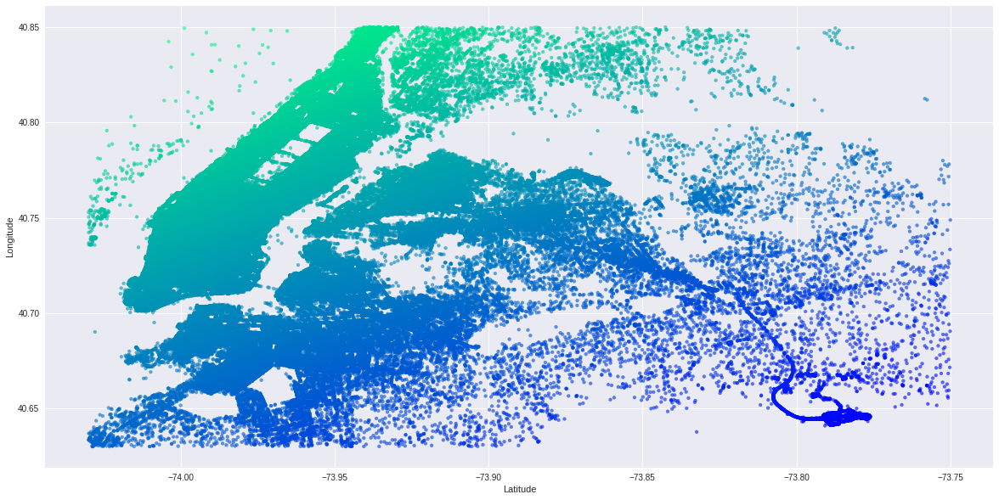

In [ ]:
x = df['dropoff_longitude'].values
y = df['dropoff_latitude'].values

plot_points(x, y, xname='Latitude', yname='Longitude', cmap='winter', dim=(20,10), s=15, alpha=0.6)

We notice that the pickup locations are more focused on main roads while the dropoff locations are everywhere.<br>
An explaination could be that people need to take rides from main roads to their homes.

# Loading the preprocessed datasets we have stored 

In [ ]:
df, df_test = load_data(ROOT_PATH + 'data/train_new.pkl',
                        ROOT_PATH + 'data/test_new.pkl',
                        function=pd.read_pickle)

df_target = load_data(ROOT_PATH + 'data/target.csv', function=pd.read_csv)

# Question 1

Trying for k=3 clusters first.

In [ ]:
from sklearn.cluster import KMeans


location_df = df[["pickup_longitude", "pickup_latitude"]]

# NY outliers have been removed before


# trying 3 clusters
kmeans = KMeans(n_clusters=3, max_iter=1000).fit(location_df)

centroids = kmeans.cluster_centers_
# print(centroids)

In [ ]:
print(kmeans.cluster_centers_)

[[-73.9697763   40.77008431]
 [-73.87468774  40.7684277 ]
 [-73.99316572  40.73478774]
 [-73.78534937  40.64691151]]


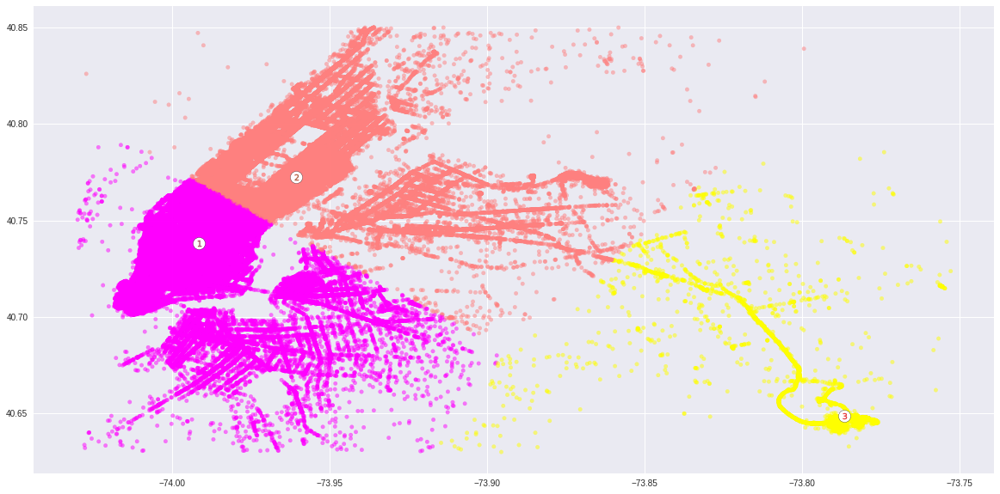

In [ ]:
plt.figure(figsize=(20,10))

plt.scatter(location_df['pickup_longitude'], location_df['pickup_latitude'],
            c= kmeans.labels_.astype(float), cmap='spring', s=20, alpha=0.5)


# different number for every cluster
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o', 
            c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centroids):
    plt.scatter(c[0], c[1], marker='$%d$' % (i+1), s=50, alpha=1., edgecolor='r')

Using the elbow method to find the optimal number of clusters (with `K_max = 10`)

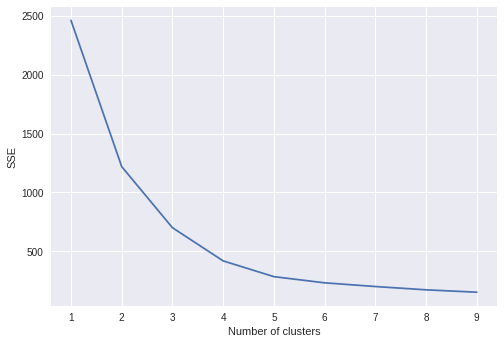

In [ ]:
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(location_df)
    sse[k] = kmeans.inertia_ 
    # print("new iter")

mpl.style.use('seaborn')
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of clusters")
plt.ylabel("SSE")
plt.show()

We observe that the the value of k at the elbow is 4 (probably). One can argue that the elbow is 5, but we think that after 4 the change in the slope is quite small. So we run KMeans with 4 clusters.

In [ ]:
num_elbow = 4
kmeans = KMeans(n_clusters=num_elbow, max_iter=1000).fit(location_df)

centroids = kmeans.cluster_centers_
# print(centroids)

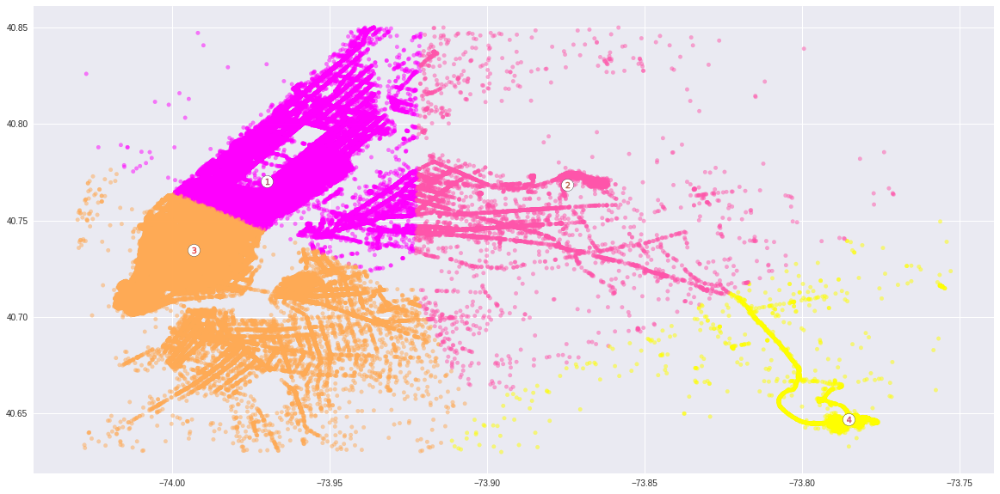

In [ ]:
plt.figure(figsize=(20,10))

plt.scatter(location_df['pickup_longitude'], location_df['pickup_latitude'], c= kmeans.labels_.astype(float), cmap='spring', s=20, alpha=0.5)

# different number for every cluster
plt.scatter(centroids[:, 0], centroids[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

for i, c in enumerate(centroids):
    plt.scatter(c[0], c[1], marker='$%d$' % (i+1), s=50, alpha=1., edgecolor='r') 

For `k=4` we have a pretty good clustering. Although, the clustering for `k=3` is also quite good, as shown before.



# Question 2

In [ ]:
from sklearn.ensemble import RandomForestRegressor

In [ ]:
def plot_imp(regr, names, title='Feature importances using MDI', low=.3, high=1., cmap='Reds', style='seaborn', dim=None):
    mpl.style.use(style)


    importances = regr.feature_importances_
    std = np.std([tree.feature_importances_ for tree in regr.estimators_], axis=0)
    forest_importances = pd.Series(importances, index=names)

    fig, ax = plt.subplots(figsize=(dim if dim else plt.rcParams["figure.figsize"]))

    my_cmap = plt.get_cmap(cmap)
    rand = np.random.uniform(low=low, high=high, size=len(names))

    forest_importances.plot.bar(yerr=std, ax=ax, color=my_cmap(rand))

    ax.set_title(title)
    ax.set_ylabel("Mean decrease in impurity")

    fig.tight_layout()

In [ ]:
def manip(words):
    if (type(words[0]) != str):
        return words

    s = set(words)
    d = {element: i for element, i in zip(s, range(1, len(s) + 1))}
    return [d[w] for w in words]

def extract_features(df, features):
    assert(set(features).issubset(df.columns))
    l = [manip(df[feature].values) for feature in features]
    return np.array(l).T
    
def get_data(train, test, target, features, frac=1., random_state=None):
    df_train = train.sample(frac=frac, random_state=random_state)

    x_train = extract_features(df_train, features)
    y_train = df_train['log_trip_duration']

    x_test = extract_features(test, features)
    y_test = [np.log(i) for i in target['trip_duration'].values]

    return x_train, y_train, x_test, y_test

In [ ]:
features = ['vendor_id', 'distance', 'passenger_count', 
            'pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude',
            'pickup_day_period', 'pickup_day_name', 'pickup_month', 'pickup_hour', 'pickup_season']

x_train, y_train, x_test, y_test = get_data(df, df_test, df_target, features, frac=0.2, random_state=0)

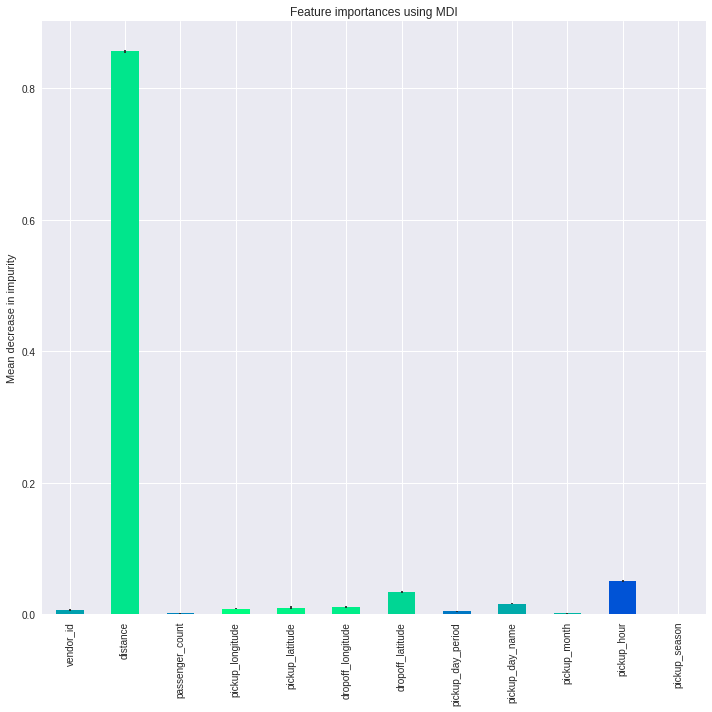

In [ ]:
regr = RandomForestRegressor(max_depth=10, n_estimators=50, random_state=0)
regr.fit(x_train, y_train)

plot_imp(regr, features, cmap='winter', dim=(10,10))

We see that, as expected, distance is the overwhelmingly most important factor on a trip's duration.

The pickup hour is the second most important factor. This is expected as well, because during rush hours the duration of the trip increases and conversely there are hours where there isn't much traffic and therefore the trip lasts less time than usual.

In addition the pickup and dropoff locations seem to have a relatively (excluding distance) big role on the trip's duration. This is because there are certain streets that are more affected by traffic, there are locations that are not easily accessible at all and so on.

# Question 3

In [ ]:
import time
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.metrics import classification_report

from sklearn.model_selection import cross_validate, KFold, train_test_split
from sklearn.metrics import make_scorer, mean_absolute_error, mean_squared_error

In [ ]:
def fine_tune(regr, param_grid, X_train, y_train, X_test, y_test, cv=10, refit=True, verbose=0, message=''):
      start_time = time.time()

      grid = GridSearchCV(estimator=regr, param_grid=param_grid, cv=cv, refit=refit, verbose=verbose)
      grid.fit(X_train, y_train)

      to_print = (message + ' took') if message != '' else 'Took'
      print(to_print + ' %.2f seconds' % (time.time() - start_time))

      print(grid.best_params_)
      return grid.best_estimator_


def grid(regr, X, y, frac=0.8, cv=10, message=''):
    
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 1. - frac, random_state = 101)

    # default: max_depth=None, n_estimators=100, max_features='auto'
    param_grid = [   {'max_depth': [10, 20, 40, 100, 200], 'n_estimators': [10, 50, 100, 200, 400], 'max_features': ['auto', 'sqrt', 'log2']}]

    return fine_tune(regr, param_grid, X_train, y_train, X_test, y_test)

In [ ]:
# Takes 6.5 minutes
x, y, _, _ = get_data(df, df_test, df_target, features, frac=0.001, random_state=0)

best_regr = grid(RandomForestRegressor(), x, y)

Took 391.46 seconds
{'max_depth': 40, 'max_features': 'sqrt', 'n_estimators': 400}


## Observation about the results:
Performing a GridSearch to fine tune the model, we get the expected results <br>
* Max depth was not the biggest one given. <br>
  A big value would lead to overfitting, while a small one to underfitting, 
  hence the value returned.
* n_estimators which is the parameter tha controls the number of trees that are
  considered is, as expected the largest one given. <br>
  By taking into consideration more trees, it reduces the variance of the model and 
  makes it less sensitive to  noise, while not increasing the bias (at least 
  significantly in respect to the reduction of variance).
* Max features controls another bagging method used by random forests. <br>
  If some features are very strong predictors, they will be chosen to many of 
  the trees causing them to become correlated. This is not something acceptable 
  since we want the estimators to be as uncorrelated as possible. <br>
  Hence by having a max number of features, we ensure that the random 
  subset of features chosen during feature bagging will (statistically) lead to 
  less correlation between the subsamples for the trees.  

## Bias-Variance analysis  

A convinient assumption one could make is that the random variables are $i.i.d.$ <br>
In most cases such the independent assumption is not actually true and therefore we drop it in order to develop algorithms that work better for real data. 

Let $X_i$ be $N$ identically distributed random variables correlated by $ρ$ (the bootstrap samples) <br>
$Var(\bar{X})=ρ⋅σ^2+\frac{1-ρ}{N}⋅σ^2$

Increasing the number of samples decreases the variance.  <br>
Introducing methods to make the samples more decorrelated reduces $ρ$ and hence, also, reduces the variance.

By standarizing the variables we get a unit variance and $lim_{N\to∞}{Var(\bar{X})}=ρ$ and we can clearly see why such methods should be employed to improve the model and we have a more formal explanation for our results.


# Question 4

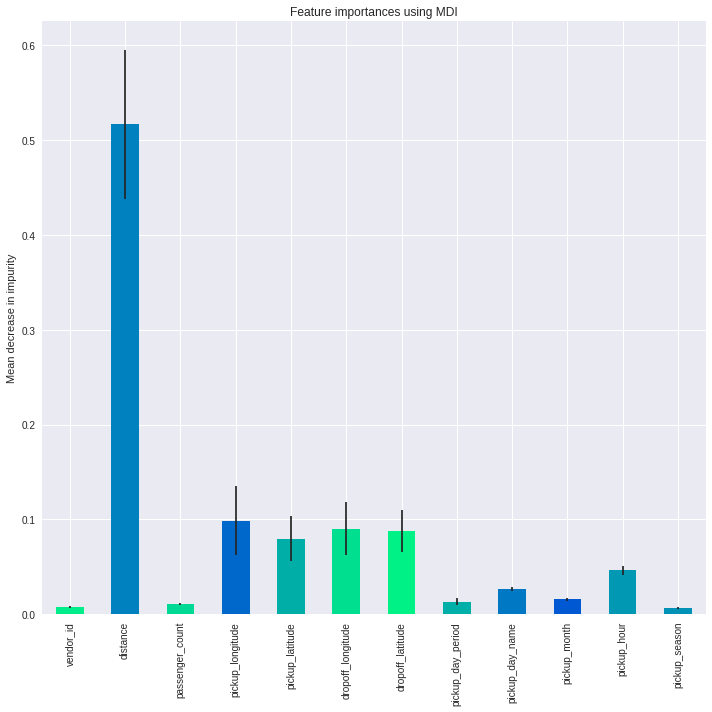

In [ ]:
# Takes 2 min 20 sec
x_train, y_train, x_test, y_test = get_data(df, df_test, df_target, features, frac=0.1, random_state=0)
best_regr.fit(x_train, y_train)
plot_imp(best_regr, features, cmap='winter', dim=(10,10))

We notice that as previously the distance is the overwhelmingly most important factor on a trip's duration and that the pickup hour is an important factor.
But now the location of the pickup and the dropoff are a major factor (bigger than the pickup hour on the original model). This could be because the new model has identified locations such are junctions, roads with inadequate green time of the traffic lights and many more.


# Question 5

In [ ]:
predicted = best_regr.predict(x_test)
print('Mean Absolute Error (MAE): %.3f\nMean Squared Error (MSE): %.3f' % (mean_absolute_error(y_test, predicted), 
                                                                            mean_squared_error(y_test, predicted)))

Mean Absolute Error (MAE): 0.287
Mean Squared Error (MSE): 0.194


From the MAE we see that the average prediction has an error of about `0.29` log-seconds from its true value. This is $e^{0.29}≈1.34$ seconds of error which is a very good result.

The MSE produces a lower value due to the fact that the absolute value of most errors are, as we see, less than 1 and therefore squaring it gives us a smaller value. <br>
MSE gives greater weight to the outlier, for the simple reason that if they have a very high error in respect to the non-outliers and squaring it leads to a much worse error taken into consideration, but we have removed them and we get the described behavior. <br>

# Bonus

By using the folium library, we can visualize the points of interest in the NY map. Using the `folium.Circle`, we can zoom in and out in the map, and see the points grouped (similar to cluster). We have to note, that we tried to take into consideration the whole pickup points of the dataset, but the map never seemed to render properly. For that reason, we used a small random subset of the original dataset. 

In [ ]:
import folium
from folium.plugins import MarkerCluster

m = folium.Map(location=[40.63, -74.03], zoom_start=12.5)

marker_cluster = MarkerCluster().add_to(m)

# make a small subset
small_df = df.sample(n=10000, random_state=1)


for index, row in small_df.iterrows():
    # If there is information about its location
    if not np.isnan(row['pickup_latitude']) and not np.isnan(row['pickup_longitude']):
        # Add it to the marker cluster
        folium.Circle(
            radius=50,
            location=[row['pickup_latitude'], row['pickup_longitude']],
            color='#3186cc',
            fill=True,
            fill_color='#3186cc'
        ).add_to(marker_cluster)

m